<img src="https://webna.ir/wp-content/uploads/2018/08/%D9%85%DA%A9%D8%AA%D8%A8-%D8%AE%D9%88%D9%86%D9%87.png" width=50% />

<div class="alert alert-block alert-success">
    <h1 align="center">Machine Learning in Python</h1>
    <h3 align="center">Project1</h3>
</div>

<img src = "https://www.eesc.europa.eu/sites/default/files/styles/large/public/images/shutterstock_1642888921.jpg?itok=P9-6YhGd" width=50%>

## Importing the libraries

In [34]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import sklearn
import os
import plotly.express as px
import sweetviz
from joblib import dump, load


from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

import xgboost as xgb
from lightgbm import LGBMRegressor


import warnings
warnings.filterwarnings('ignore')


## Load and Prepare Data

In [35]:
data=pd.read_csv(r'F:\jupyter\educational-\educational\csv\mansori\country_vaccinations.csv')
data.head(5)

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


In [36]:
print(data.describe,5*'\n')
print(data.info,5*'\n')
print(data.isnull().sum())

<bound method NDFrame.describe of            country iso_code        date  total_vaccinations  \
0      Afghanistan      AFG  2021-02-22                 0.0   
1      Afghanistan      AFG  2021-02-23                 NaN   
2      Afghanistan      AFG  2021-02-24                 NaN   
3      Afghanistan      AFG  2021-02-25                 NaN   
4      Afghanistan      AFG  2021-02-26                 NaN   
...            ...      ...         ...                 ...   
31235     Zimbabwe      ZWE  2021-07-11           1491397.0   
31236     Zimbabwe      ZWE  2021-07-12           1531868.0   
31237     Zimbabwe      ZWE  2021-07-13           1575539.0   
31238     Zimbabwe      ZWE  2021-07-14           1613640.0   
31239     Zimbabwe      ZWE  2021-07-15           1666862.0   

       people_vaccinated  people_fully_vaccinated  daily_vaccinations_raw  \
0                    0.0                      NaN                     NaN   
1                    NaN                      NaN      

## EDA

In [37]:
columns_to_drop = ['source_website','source_name']
existing_columns = [col for col in columns_to_drop if col in data.columns]
data.drop(columns=existing_columns, inplace=True)

for c, n in data.isnull().sum().items():
    if n > 300:
        data.drop(c, axis=1, inplace=True)  # Use axis=1 to drop columns

data['daily_vaccinations'].fillna(data['daily_vaccinations'].mean(), inplace=True)
data['daily_vaccinations_per_million'].fillna(data['daily_vaccinations_per_million'].mean(), inplace=True)

data.isnull().sum()


country                           0
iso_code                          0
date                              0
daily_vaccinations                0
daily_vaccinations_per_million    0
vaccines                          0
dtype: int64

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:00 -> (00:00 left)



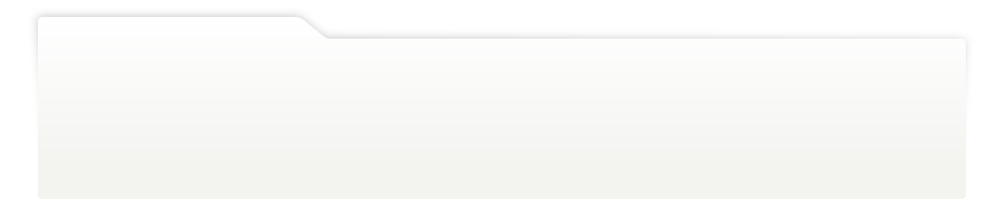
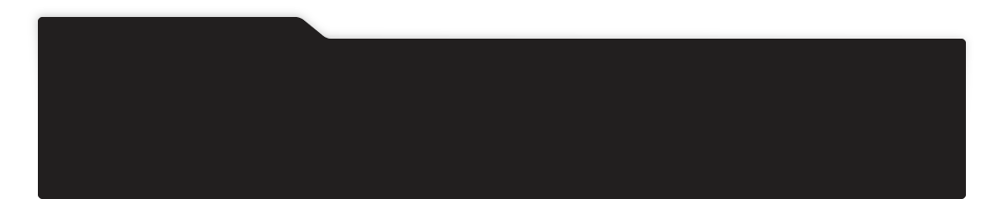
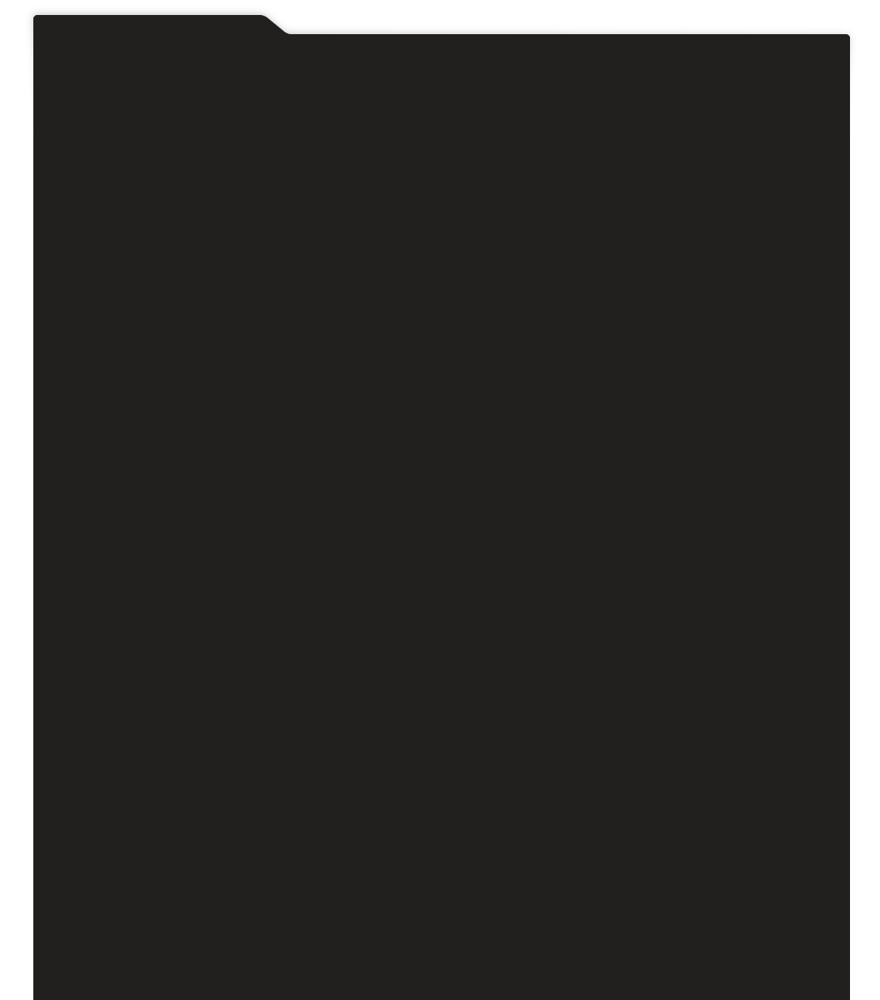
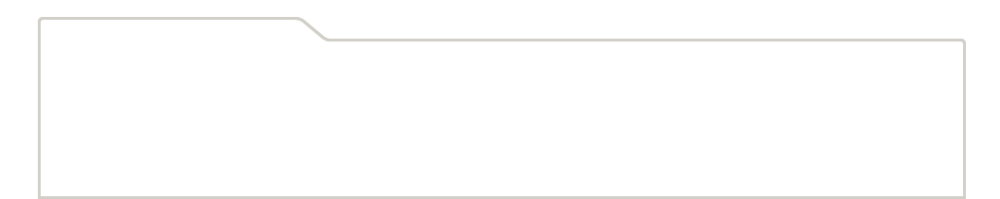
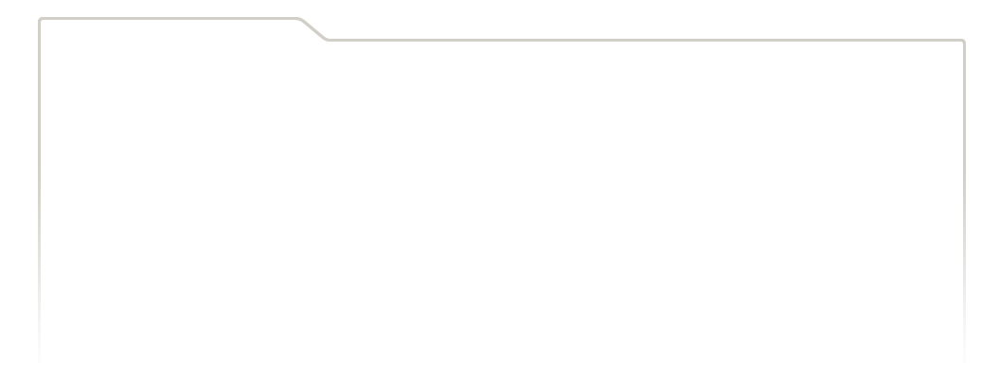
...
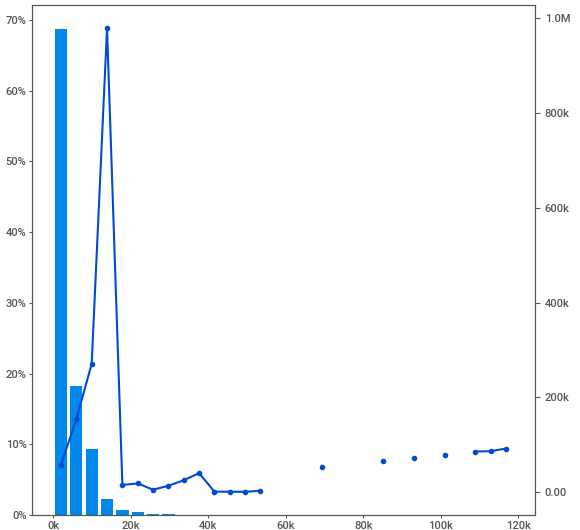
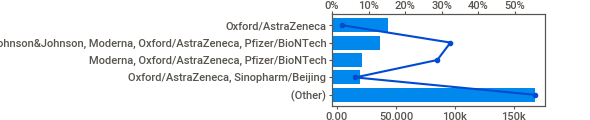
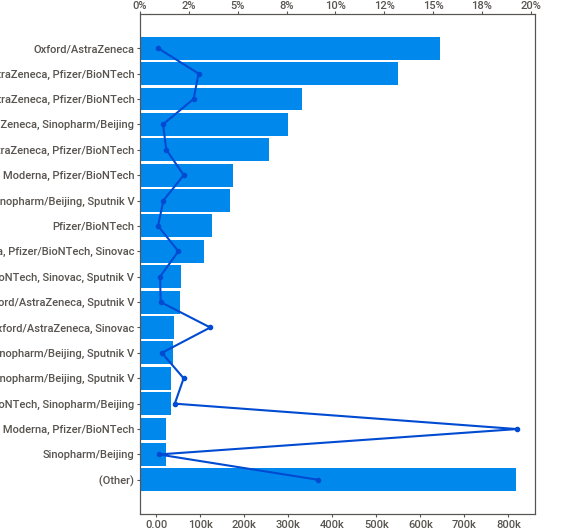
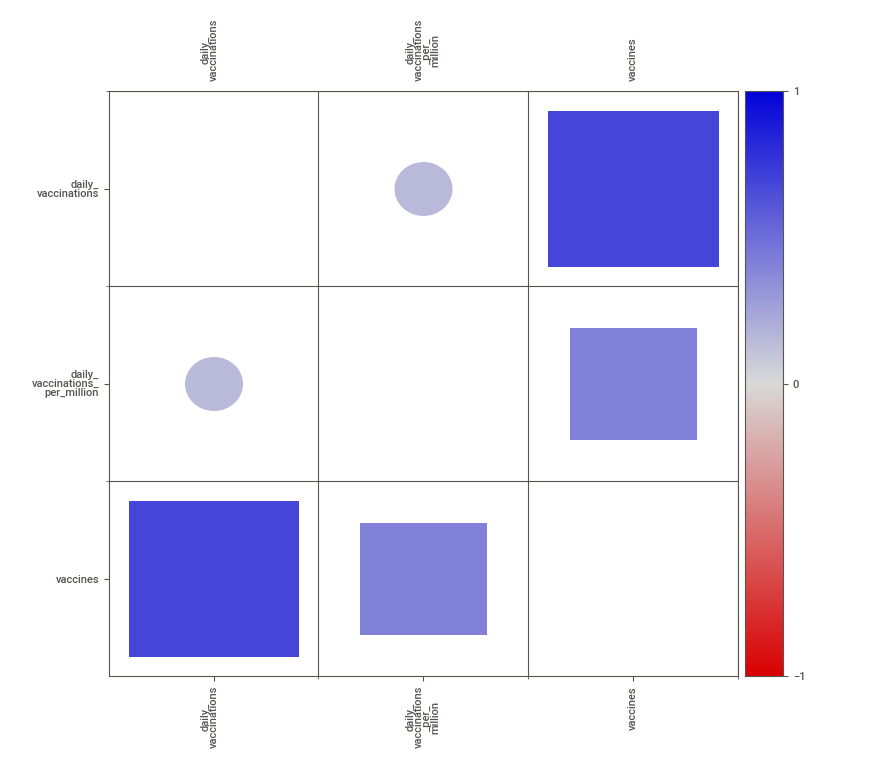
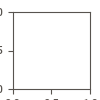

In [38]:
report = sweetviz.analyze([data,'train'],target_feat='daily_vaccinations')
report.show_notebook(w=1000,h=800)


array([[<Axes: title={'center': 'daily_vaccinations'}>,
        <Axes: title={'center': 'daily_vaccinations_per_million'}>]],
      dtype=object)

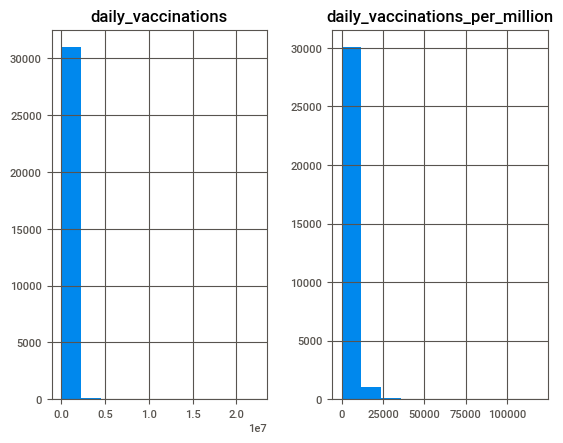

In [39]:
data.drop(columns=['country']).hist()


## Data Preprocessing

In [40]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df=data.copy()
df['country']=le.fit_transform(data['country'])
df['iso_code']=le.fit_transform(data['iso_code'])
df['vaccines']=le.fit_transform(data['vaccines'])
df['date'] = pd.to_datetime(df['date'])
df = df.set_index('date').to_period(freq='D')
df.head(5)

,country,iso_code,daily_vaccinations,daily_vaccinations_per_million,vaccines
date,,,,,
2021-02-22,0,1,114971.789486,3426.365969,17
2021-02-23,0,1,1367.000000,35.000000,17
2021-02-24,0,1,1367.000000,35.000000,17
2021-02-25,0,1,1367.000000,35.000000,17
2021-02-26,0,1,1367.000000,35.000000,17


In [41]:
px.line(df,y='daily_vaccinations_per_million',x=data['date'],color= data['country'], title='Daily Vaccinations Per Million according to countries')


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': ('color=Afghanistan<br>x=%{x}<br' ... 'er_million=%{y}<extra></extra>'),
              'legendgroup': 'Afghanistan',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': 'Afghanistan',
              'showlegend': True,
              'type': 'scattergl',
              'x': array(['2021-02-22', '2021-02-23', '2021-02-24', '2021-02-25', '2021-02-26',
                          '2021-02-27', '2021-02-28', '2021-03-01', '2021-03-02', '2021-03-03',
                          '2021-03-04', '2021-03-05', '2021-03-06', '2021-03-07', '2021-03-08',
                          '2021-03-09', '2021-03-10', '2021-03-11', '2021-03-12', '2021-03-13',
                          '2021-03-14', '2021-03-15', '2021-03-16', '2021-03-17', '2021-03-18',
                          '2021-03-19', '2021-03-20', '2021-03-21', '2021-03-22', '2021-03-23',
                          '2021-03-24', '2021-03-25', '2021-03-26', '2021-03-27', '2021-03-28',
                          '2021-03-29', '2021-03-30', '2021-03-31', '2021-04-01', '2021-04-02',
                          '2021-04-03', '2021-04-04', '2021-04-05', '2021-04-06', '2021-04-07',
                          '2021-04-08', '2021-04-09', '2021-04-10', '2021-04-11', '2021-04-12',
                          '2021-04-13', '2021-04-14', '2021-04-15', '2021-04-16', '2021-04-17',
                          '2021-04-18', '2021-04-19', '2021-04-20', '2021-04-21', '2021-04-22',
                          '2021-04-23', '2021-04-24', '2021-04-25', '2021-04-26', '2021-04-27',
                          '2021-04-28', '2021-04-29', '2021-04-30', '2021-05-01', '2021-05-02',
                          '2021-05-03', '2021-05-04', '2021-05-05', '2021-05-06', '2021-05-07',
                          '2021-05-08', '2021-05-09', '2021-05-10', '2021-05-11', '2021-05-12',
                          '2021-05-13', '2021-05-14', '2021-05-15', '2021-05-16', '2021-05-17',
                          '2021-05-18', '2021-05-19', '2021-05-20', '2021-05-21', '2021-05-22',
                          '2021-05-23', '2021-05-24', '2021-05-25', '2021-05-26', '2021-05-27',
                          '2021-05-28', '2021-05-29', '2021-05-30', '2021-05-31', '2021-06-01',
                          '2021-06-02', '2021-06-03', '2021-06-04', '2021-06-05', '2021-06-06',
                          '2021-06-07', '2021-06-08', '2021-06-09', '2021-06-10', '2021-06-11',
                          '2021-06-12', '2021-06-13', '2021-06-14', '2021-06-15', '2021-06-16',
                          '2021-06-17', '2021-06-18', '2021-06-19', '2021-06-20', '2021-06-21',
                          '2021-06-22', '2021-06-23', '2021-06-24', '2021-06-25', '2021-06-26',
                          '2021-06-27', '2021-06-28', '2021-06-29', '2021-06-30', '2021-07-01',
                          '2021-07-02', '2021-07-03', '2021-07-04', '2021-07-05', '2021-07-06',
                          '2021-07-07', '2021-07-08', '2021-07-09', '2021-07-10', '2021-07-11',
                          '2021-07-12', '2021-07-13', '2021-07-14'], dtype=object),
              'xaxis': 'x',
              'y': array([3426.36596872,   35.        ,   35.        ,   35.        ,
                            35.        ,   35.        ,   35.        ,   41.        ,
                            46.        ,   52.        ,   57.        ,   63.        ,
                            68.        ,   74.        ,   74.        ,   74.        ,
                            74.        ,   74.        ,   74.        ,   74.        ,
                            74.        ,   74.        ,   74.        ,   74.        ,
                            75.        ,   75.        ,   76.        ,   76.        ,
                            77.        ,   77.        ,   77.        ,   77.        ,
                            77.        ,   77.        ,   77.        ,   77.        ,
                         

In [42]:
vaccine = data["vaccines"].value_counts().reset_index()
vaccine.columns = ['Vaccines', 'Number of Country']

px.bar(
    vaccine,
    x='Vaccines',
    y='Number of Country',
    title='Number of Countries each vaccine is being used',
    hover_data=None,
    height=800,
    width=1000
)



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'Vaccines=%{x}<br>Number of Country=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': '',
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'textposition': 'auto',
              'type': 'bar',
              'x': array(['Oxford/AstraZeneca',
                          'Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
                          'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
                          'Oxford/AstraZeneca, Sinopharm/Beijing',
                          'Oxford/AstraZeneca, Pfizer/BioNTech', 'Moderna, Pfizer/BioNTech',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
                          'Pfizer/BioNTech', 'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
                          'Oxford/AstraZeneca, Sputnik V', 'Oxford/AstraZeneca, Sinovac',
                          'Sinopharm/Beijing, Sputnik V',
                          'Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing',
                          'Johnson&Johnson, Moderna, Pfizer/BioNTech', 'Sinopharm/Beijing',
                          'Pfizer/BioNTech, Sinovac', 'Oxford/AstraZeneca, Sinovac, Sputnik V',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinovac',
                          'Moderna, Oxford/AstraZeneca',
                          'Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing',
                          'Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac',
                          'Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac, Sputnik V',
                          'EpiVacCorona, Sputnik V',
                          'CanSino, Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac',
                          'CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
                          'CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V',
                          'Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
                          'Moderna, Pfizer/BioNTech, Sinovac',
                          'Johnson&Johnson, Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
                          'Covaxin, Oxford/AstraZeneca, Sputnik V', 'Moderna',
                          'QazVac, Sinopharm/HayatVax, Sputnik V',
                          'CanSino, Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac, Sputnik V',
                          'Pfizer/BioNTech, Sinopharm/Beijing',
                          'Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V',
                          'Johnson&Johnson, Pfizer/BioNTech',
                          'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinovac, Sputnik V',
                          'Johnson&Johnson, Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing',
                          'Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac, Sputnik V',
                          'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
                          'Pfizer/BioNTech, Sputnik V',
                          'Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sputnik V',
                          'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sputnik V', 'Sputnik V',
                          'Moderna, Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V',
                          'Oxford/AstraZeneca, RBD-Dimer, Sputnik V',
                          'Johnson&Johnson, Moderna, Oxford/AstraZe

In [43]:
px.choropleth(data,locations = 'country',locationmode = 'country names',color = 'vaccines',title = 'Vaccines used by specefic Country',hover_data= ['daily_vaccinations_per_million'],width=1000,height=800)



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'colorscale': [[0.0, '#636efa'], [1.0, '#636efa']],
              'customdata': array([[3426.36596872],
                                   [  35.        ],
                                   [  35.        ],
                                   [  35.        ],
                                   [  35.        ],
                                   [  35.        ],
                                   [  35.        ],
                                   [  41.        ],
                                   [  46.        ],
                                   [  52.        ],
                                   [  57.        ],
                                   [  63.        ],
                                   [  68.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  74.        ],
                                   [  75.        ],
                                   [  75.        ],
                                   [  76.        ],
                                   [  76.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  77.        ],
                                   [  95.        ],
                                   [ 114.        ],
                                   [ 132.        ],
                                   [ 150.        ],
                                   [ 169.        ],
                                   [ 187.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 206.        ],
                                   [ 227.        ],
                                   [ 249.        ],
                                   [ 271.        ],
                                   [ 292.        ],
                                   [ 314.        ],
                                   [ 336.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                                   [ 358.        ],
                         

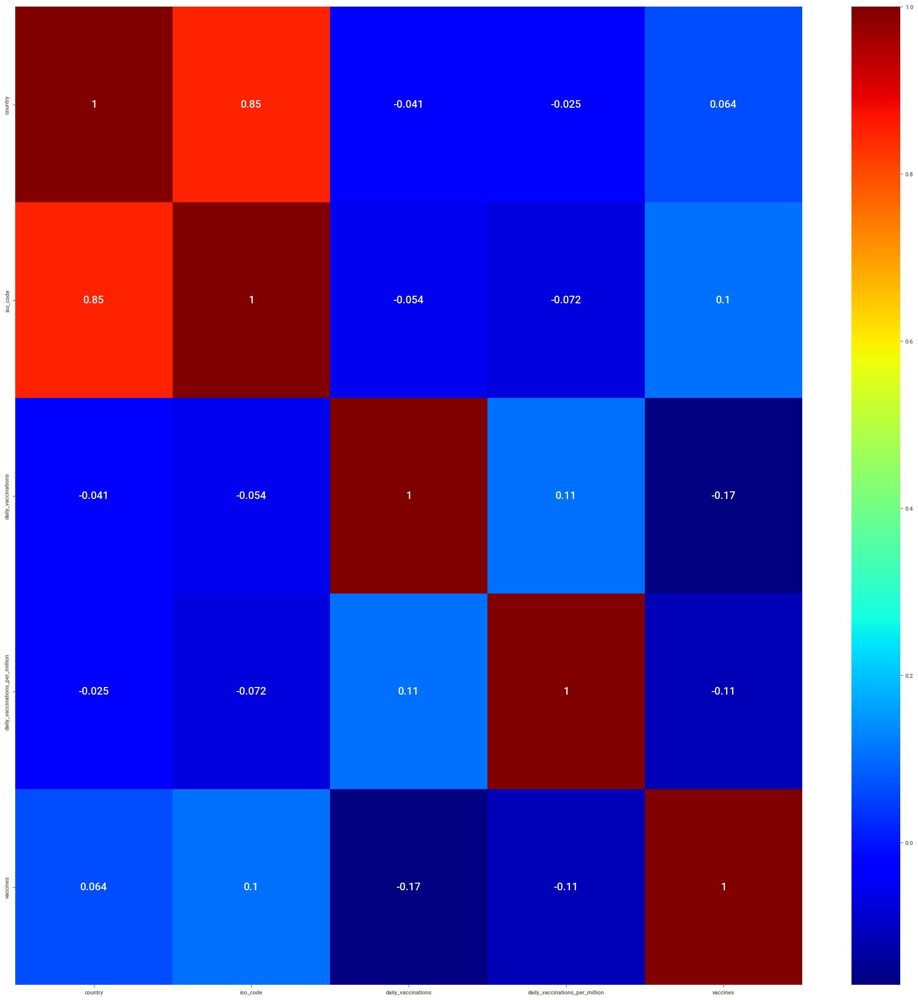

In [44]:
correlation =(df).corr()
plt.figure(figsize=(25,25))
sns.heatmap(data=correlation ,  cmap='jet', annot=True, annot_kws={'size':15})
plt.show()

## Prepare Data for Machine learning

In [45]:
def prepare_dataframe(country_name):

    df = data[data['country'] == country_name]

    df = df.drop('country', axis=1)

        # Convert to numeric or drop non-numeric columns
    df = df.apply(pd.to_numeric, errors='coerce')


    corr = df.corr()
    sorted_dict = dict(corr.loc[:,'daily_vaccinations'].sort_values(ascending=False))
    # Calculate the number of keys to select (66% of total keys)
    num_keys_to_select = int(len(sorted_dict) * 0.67)

    # Select the first 66% of keys
    selected_columns = list(sorted_dict.keys())[:num_keys_to_select]

    df_com = df.copy()
    df_selected = df[selected_columns]

    return df_com , df_selected


In [46]:
X_compelete = (prepare_dataframe('Germany')[0]).drop(['daily_vaccinations'], axis=1)
y_compelete = (prepare_dataframe('Germany')[0])['daily_vaccinations']

## Train your model

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

### Split train and test
X_compelete_train, X_compelete_test, y_compelete_train, y_compelete_test = train_test_split(X_compelete, y_compelete, test_size = 0.25, random_state = 0)


In [48]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')  # You can use other strategies like 'median'
X_compelete_train = imputer.fit_transform(X_compelete_train)
X_compelete_test = imputer.transform(X_compelete_test)


In [49]:
X_compelete_train[np.isinf(X_compelete_train)] = np.nan  # Replace `inf` with `NaN`
X_compelete_test[np.isinf(X_compelete_test)] = np.nan


In [50]:
print(np.isnan(X_compelete_train).sum())  # Should be 0
print(np.isinf(X_compelete_train).sum())  # Should be 0


0
0


In [51]:
### standardization

SC = StandardScaler()
X_compelete_train = SC.fit_transform(X_compelete_train)
X_compelete_test = SC.transform(X_compelete_test)


## Test the model and show the metrics

## Save your final model

In [52]:
def lightGBM__(X_train, X_test,y_train, y_test):

    model = LGBMRegressor()

    ## params
    n_estimators=[1000]
    max_depth = [3, 4, 5]
    learning_rate=[0.01, 0.02, 0.04, 0.1, 0.2]
    subsample=[0.6, 0.8]
    colsample_bytree=[0.6, 0.8]
    num_leaves = [5, 20, 31]


    grid = dict(max_depth=max_depth, num_leaves=num_leaves, learning_rate=learning_rate, subsample=subsample, colsample_bytree=colsample_bytree, n_estimators=n_estimators)
    cv = TimeSeriesSplit(n_splits=10)
    grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
    grid_result = grid_search.fit(X_train, y_train)

    best_params = grid_result.best_params_
    lgbm = LGBMRegressor(max_depth=best_params['max_depth'], num_leaves=best_params['num_leaves'], learning_rate=best_params['learning_rate'], subsample=best_params['subsample'], colsample_bytree=best_params['colsample_bytree'], n_estimators=best_params['n_estimators'])
    accuracies = cross_val_score(estimator = lgbm, X = X_train, y = y_train, cv = cv)

    Accuracy_CrossVal = "{:.2f} %".format(accuracies.mean()*100)

    lgbm.fit(X_train, y_train)
    y_pred = lgbm.predict(X_test)

    rmse = "%f" % (np.sqrt(mean_squared_error(y_test, y_pred)))
    r2 = "%f" % (np.abs(r2_score(y_test, y_pred)))
    mae ="%f" % (np.sqrt(mean_absolute_error(y_test, y_pred)))
    
    dump(model, 'final_model.joblib')
    
    plt.figure(figsize=(10, 5), dpi=80)
    x_ax = range(len(y_test))
    plt.plot(x_ax, y_test, label="test")
    plt.plot(x_ax, y_pred, label="predicted")
    plt.title("Carbon Dioxide Emissions - Test and Predicted data")
    plt.legend()
    plt.show()
    
    
    return Accuracy_CrossVal, rmse, r2, mae


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 150, number of used features: 1
[LightGBM] [Info] Start training from score 408565.398594
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 20, number of used features: 0
[LightGBM] [Info] Start training from score 415548.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there ar

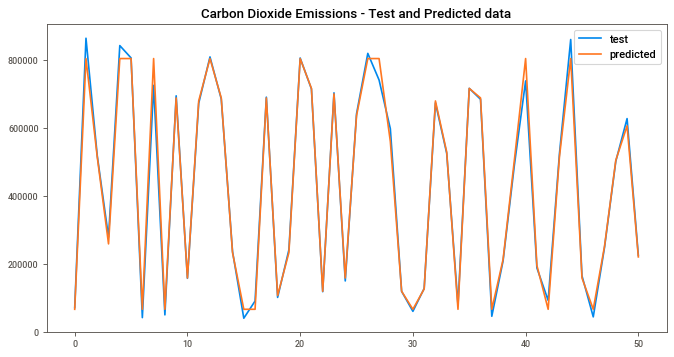

('78.08 %', '24300.646778', '0.993208', '123.406067')

In [53]:
lightGBM__(X_compelete_train, X_compelete_test, y_compelete_train, y_compelete_test)


## Send us the Result (Maktabkhoone)